<a href="https://colab.research.google.com/github/AnupamaRajkumar/3D-Computer-Vision/blob/master/LandfillPipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Solaris installation with gdal\
!add-apt-repository ppa:ubuntugis/ppa -y\
!apt-get update\
!apt-get install python-numpy gdal-bin libgdal-dev python3-rtree\

!pip install solaris==0.2.0

In [ ]:
!pip3 install torch torchvision
!pip3 install py7zr
!pip3 install rasterio
!pip3 install --upgrade earthpy

Solaris installation

In [ ]:
!add-apt-repository ppa:ubuntugis/ppa -y
!apt-get update
!apt-get install python-numpy gdal-bin libgdal-dev python3-rtree\

!pip install solaris==0.2.0

In [ ]:
#python imports
import py7zr
import os
import time
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
import matplotlib.pyplot as plt

#earth observation python lib imports
import rasterio
import solaris as sol
import geopandas as gpd
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

#pytorch imports
import torch
from torch import nn
from torchvision import datasets, transforms, models
import torchvision.transforms.functional as TF
import torch.optim as optim
from torchvision.models.vgg import VGG

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")
print('Using device:', device)

Using device: cuda:0


load dataset from github\
repo path : https://github.com/AnupamaRajkumar/LandfillDataset.git


In [ ]:
#!apt-get update && apt-get upgrade
#!apt-get install git-lfs

Use this if downloading from git (ie. LFS quota available!)

In [ ]:
#!git lfs clone https://github.com/AnupamaRajkumar/LandfillDataset.git

Declaring paths

In [ ]:

#All the paths related to multispectral dataset
Multispectral_path = './Multispectral.7z'                                       #path of zip files
TIF_file_path = './MultiSpectral/HR_TIF_Files.7z'
JSON_file_path = './MultiSpectral/LandfillCoordPolygons.7z'
json_path = './LandfillCoordPolygons'
train_path = './HR_TIF_Files'
train_labels = './MultiSpectral/MultiSpectralData.csv'

#All the paths related to pansharpened datset
Pansharpened_path = './Pansharpened.7z'
PanSharpened_TIF_file_path = './Pansharpened/HR_TIF_Files.7z'

#Output directory path
out_path = './'                                                                 #output path of extracted files

#dimensions of the figure to be displayed
width = 15
height = 15

Extract the images from zip folder

In [ ]:
def ExtractFiles(in_path, out_path):
  with py7zr.SevenZipFile(in_path, mode='r') as z:
    z.extractall(out_path)

Use following functions downloading dataset from dropbox

Multispectral dataset

In [ ]:
def DownloadMultiSpectralDataset():
  !wget https://www.dropbox.com/s/go95ez8lez9113y/MultiSpectral.7z?dl=0
  os.rename('MultiSpectral.7z?dl=0', 'Multispectral.7z')
  ExtractFiles('Multispectral.7z', out_path)

Pansharpened dataset

In [ ]:
def DownloadPanSharpenedDataset():
  !wget https://www.dropbox.com/s/qb0dfxjafuodc27/Pansharpened.7z?dl=0
  os.rename('Pansharpened.7z?dl=0', 'Pansharpened.7z')
  ExtractFiles('Pansharpened.7z', out_path)
  #os.rmdir(Pansharpened_path)

In [ ]:
DownloadMultiSpectralDataset()

--2021-04-12 11:06:04--  https://www.dropbox.com/s/go95ez8lez9113y/MultiSpectral.7z?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:601a:18::a27d:712
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/go95ez8lez9113y/MultiSpectral.7z [following]
--2021-04-12 11:06:04--  https://www.dropbox.com/s/raw/go95ez8lez9113y/MultiSpectral.7z
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc836639d5544e8a9b2d43ac8c88.dl.dropboxusercontent.com/cd/0/inline/BMd8mCWU5pQt3NHeberqXjYSm_ME7YbI0VXFVya_mnTX9FbMFkIWJNGkq9ELoYVxGLZUwJ_ev_DOs6nm3Ws00sSmUZ0p2WgO8jtZRiZk4WBpZIt61hpoPTsNFcHFOlnkmmQoNF2-JwWESBIRzkjD-TnN/file# [following]
--2021-04-12 11:06:04--  https://uc836639d5544e8a9b2d43ac8c88.dl.dropboxusercontent.com/cd/0/inline/BMd8mCWU5pQt3NHeberqXjYSm_ME7YbI0VXFVya_mnTX9FbMFkIWJNGkq9ELoYVxGLZUwJ_ev

Extracting the multispectral dataset\
Run this cell if working with multispectral dataset

In [ ]:
#extract multispectral images
ExtractFiles(TIF_file_path , out_path)
#extract multispectral json files
ExtractFiles(JSON_file_path , out_path)

Extracting the pansharpened dataset\
Run this cell if working with pansharpened dataset

In [ ]:
 """ 
  #extract pansharpened images
  ExtractFiles(PanSharpened_TIF_file_path , out_path)
  #extract multispectral json files
  #ExtractFiles(JSON_file_path , out_path)
"""

' \n #extract pansharpened images\n ExtractFiles(PanSharpened_TIF_file_path , out_path)\n #extract multispectral json files\n #ExtractFiles(JSON_file_path , out_path)\n'

In [ ]:
def im_convert(image_name, channels):
  image = rasterio.open(os.path.join(train_path, image_name)).read()
  #false color composite visualisation
  if(channels == 8):
    raster = np.dstack((image[4,:,:], image[2,:,:],image[1,:,:])) 
  elif(channels == 4):
    raster = np.dstack((image[2,:,:], image[1,:,:],image[0,:,:]))
  return raster

Displaying a few images from the folder

Number of images images: 146
-------------multispectral images----------------
image :  00090_Malta_France.tif channels : 8


<Figure size 1800x1800 with 0 Axes>

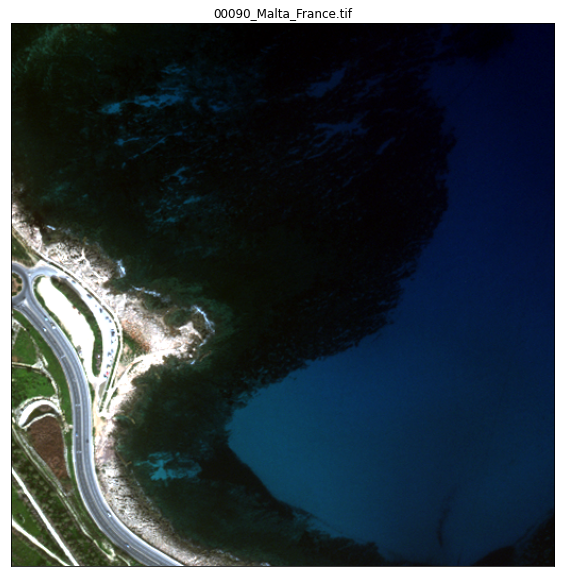

image :  00002_Abd_India.tif channels : 4


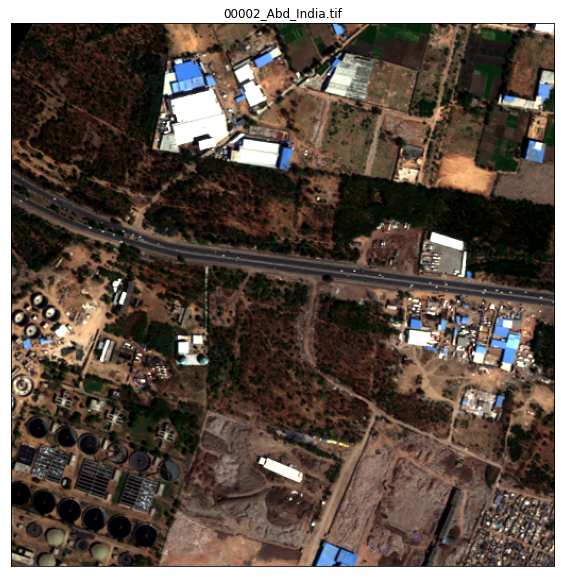

image :  000141_Vinca_Serbia.tif channels : 8


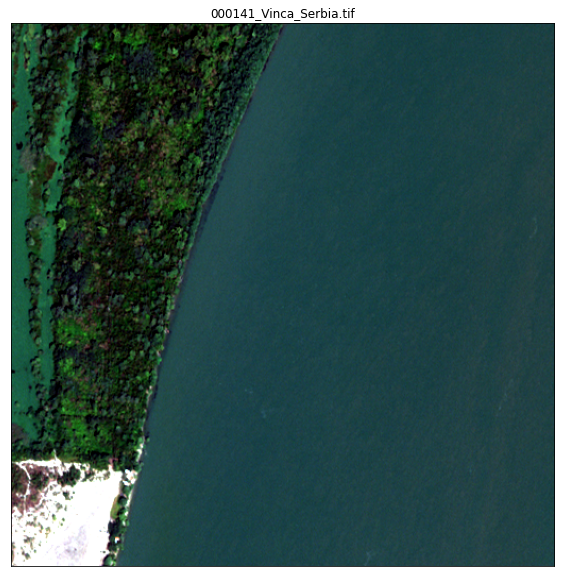

image :  000128_Vinca_Serbia.tif channels : 8


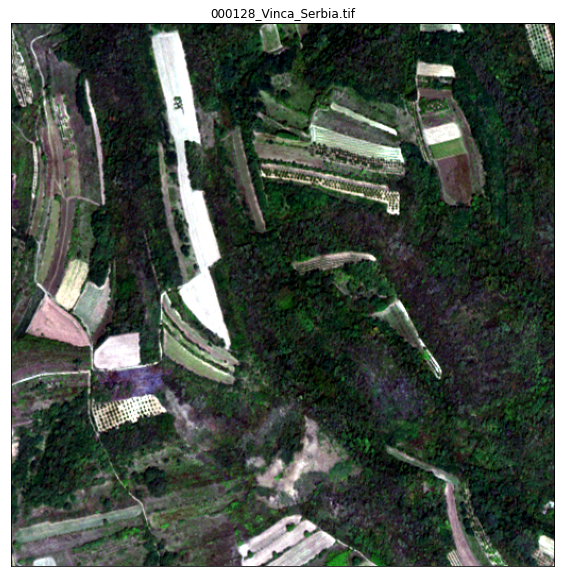

image :  00114_Rio_Brazil.tif channels : 4


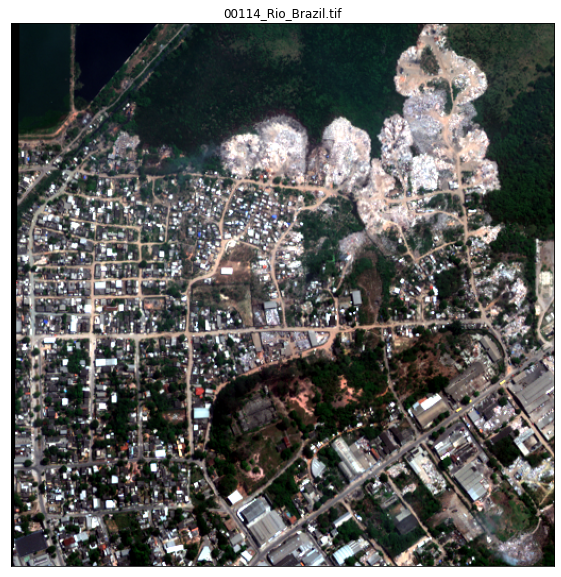

image :  00084_Malta_France.tif channels : 8


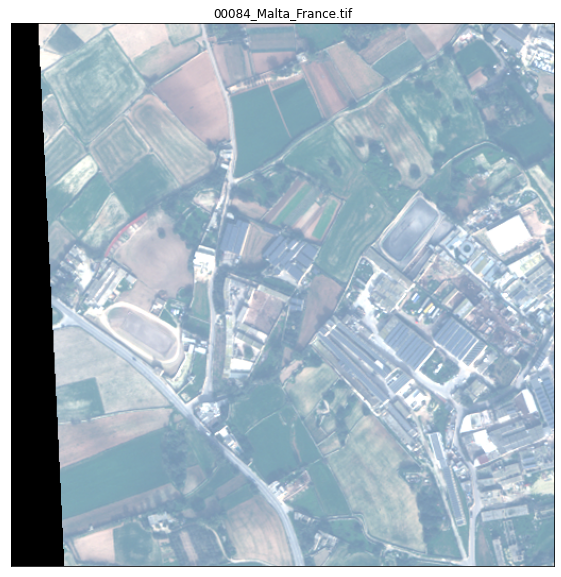

In [ ]:
train_files = os.listdir(train_path)

num_of_train_images = len([name for name in train_files if os.path.isfile(os.path.join(train_path, name))])
print("Number of images images:", num_of_train_images)
selected = np.random.choice(num_of_train_images, 6)

fig = plt.figure(figsize = (25,25))
print('-------------multispectral images----------------')

for i, ind in enumerate(selected):
  raster_arr = rasterio.open(os.path.join(train_path, train_files[ind])).read()
  channels = raster_arr.shape[0]
  print("image : " , train_files[ind], "channels :", channels)
  #false color composite visualisation
  if(channels == 8):
    rgb = (4,2,1)             #R, G, B bands
  elif(channels == 4):
    rgb = (2,1,0)             #R, G, B bands

  ep.plot_rgb(raster_arr, rgb=rgb, stretch=True, title=train_files[ind])
  plt.show()
  #plt.imshow(raster_fcc)
  #plt.title(train_files[ind])

Loading the dataset from the split dataset

referred from:\
https://github.com/tkshnkmr/frcnn_medium_sample,
https://pytorch.org/tutorials/beginner/data_loading_tutorial.html

Checking the proportion of data classes in the dataset

In [ ]:
dataFrame = pd.read_csv(train_labels, usecols=["Idx", "Image Index", "IsLandfill"])
data = dataFrame.values.tolist()
label = pd.read_csv(train_labels, usecols=["IsLandfill"])


def get_class_count(data):
  grp = data.groupby(["IsLandfill"]).nunique()
  return{key : grp[key] for key in list(grp.keys())}

def get_class_proportion(data):
  class_count = get_class_count(data)
  return {val[0]: round(val[1]/data.shape[0], 4) for val in class_count.items()}

#print("Dataset class counts:", get_class_count(dataFrame))
print("Dataset class proportions:", get_class_proportion(dataFrame))

Dataset class proportions: {'Idx': IsLandfill
0    0.6276
1    0.3724
Name: Idx, dtype: float64, 'Image Index': IsLandfill
0    0.6276
1    0.3724
Name: Image Index, dtype: float64}


Tackling the imabalanced dataset
1. Undersampling : Randomly delete some observations from the majority class in order to match the numbers with the minority class. Suitable when there is a lot of data
2. Oversampling : Add copies of instances from under-represented class. Suitable for smaller dataset

We will use random over-sampling as we have a small set of data - TBD

Stratified and random split into train, test and validation datasets

In [ ]:
train_ratio = 0.80
test_ratio = 0.20
#validation_ratio = 0.10

train_idx, test_idx, train_lab, test_lab = train_test_split(dataFrame, label, 
                                                            test_size = test_ratio, 
                                                            shuffle=True, stratify=label)

"""
train_idx, val_idx, train_lab, val_lab = train_test_split(train_idx, train_lab,
                                                          test_size = validation_ratio,
                                                          shuffle=True, stratify=train_lab)
"""


print("Train size is {}, test size is {}".format(len(train_idx), len(test_idx)))

print("****************Dataset proportion after stratified splitting***************")
print("Train data class proportions:", get_class_proportion(train_idx))
print("Test data class proportions:", get_class_proportion(test_idx))

Train size is 116, test size is 29
****************Dataset proportion after stratified splitting***************
Train data class proportions: {'Idx': IsLandfill
0    0.6293
1    0.3707
Name: Idx, dtype: float64, 'Image Index': IsLandfill
0    0.6293
1    0.3707
Name: Image Index, dtype: float64}
Test data class proportions: {'Idx': IsLandfill
0    0.6207
1    0.3793
Name: Idx, dtype: float64, 'Image Index': IsLandfill
0    0.6207
1    0.3793
Name: Image Index, dtype: float64}


In [ ]:
#parameters
batch_size = 10
num_workers = 1
num_classes = 1
epochs = 100
lr = 1e-3
w_decay = 1e-5
momentum = 0
step_size = 50
gamma = 0.5
image_size = 512
patch_width = 512
patch_height= 512

Custom augmentations using imgaug library

Add transform to resize and normalise the images

In [ ]:
#transforms.ToPILImage(),
#transforms.Resize((224, 224)),
#transforms.ToTensor(),

train_transforms = transforms.Compose([transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

test_transforms = transforms.Compose([transforms.ToTensor(),
                                      transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])])

In [ ]:
class CustomLandfillDataset(torch.utils.data.Dataset):
  def __init__(self, data, transforms):                             #transforms
    self.data = data
    self.transforms = transforms
    self.json_frame = pd.read_csv(train_labels, usecols=["json index"])
    self.isLandfillList = pd.read_csv(train_labels, usecols=["IsLandfill"]).values.tolist()

  def __len__(self):
    return len(self.data)

  def __getitem__(self, index):
    #image id
    img_id = self.data[index][0]
    #path for image
    img_name = self.data[index][1]
    #read the image to extract number of channels
    raster_img = rasterio.open(os.path.join(train_path, img_name)).read()
    #change datatype of image from uint16 to int32
    raster_img = raster_img.astype('float32')
    #print(raster_img.shape)
    raster_channels = raster_img.shape[0]
    #create another image variable
    image = raster_img

    #in case the image is smaller than 512x512
    if((raster_img.shape[1] < patch_width) or (raster_img.shape[2] < patch_height)):
      image = np.zeros((patch_width, patch_height), dtype=np.float32)
      image[0:raster_img.shape[1], 0:raster_img.shape[2]] = raster_img[0,:,:]
      image = np.expand_dims(image, axis=0)
      for c in range(raster_channels-1):
        resized_raster = np.zeros((patch_width, patch_height), dtype=np.float32)
        #np.copy(resized_raster, raster_img[c,:,:])
        resized_raster[0:raster_img.shape[1], 0:raster_img.shape[2]] = raster_img[c+1,:,:]
        resized_raster = np.expand_dims(resized_raster,axis=0)
        image = np.vstack((image, resized_raster)) 

    #stack dummy channels if number of channels less than 8
    if(raster_channels < 8):
      diff = 8 - raster_channels
      dummy_channels = np.zeros((patch_width, patch_height), dtype=np.float32)
      dummy_channels = np.expand_dims(dummy_channels, axis=0)
      #print(dummy_channels.shape)
      for i in range(diff-1):
        dummy_channel = np.zeros((patch_width, patch_height), dtype=np.float32)
        dummy_channel = np.expand_dims(dummy_channel, axis=0)
        dummy_channels = np.vstack((dummy_channel, dummy_channels))
        #print("dummy_channel=", dummy_channel.shape,"dummy_channels=", dummy_channels.shape)
      image = np.vstack((image, dummy_channels))
      #print("image", image.shape)

    rgb_image = image.transpose(1,2,0)         
    if(raster_channels == 8):
      rgb_image = np.dstack((image[4,:,:], image[2,:,:], image[1,:,:]))
    elif(raster_channels == 4):
      rgb_image = np.dstack((image[2,:,:], image[1,:,:], image[0,:,:]))
    if self.transforms is not None:
      rgb_image = self.transforms(rgb_image)

    #mask
    json_list = self.json_frame.values.tolist()
    json_name = json_list[img_id-1][0]
    IsLandfill = self.isLandfillList[img_id-1][0]
    if(IsLandfill):
      fp_mask = sol.vector.mask.footprint_mask(df=os.path.join(json_path, json_name), 
                                               reference_im=os.path.join(train_path, img_name))
      fp_mask = fp_mask.astype('float32')
    else:
      fp_mask = np.zeros((patch_width, patch_height), dtype=np.float32)
    
    #create another mask variable
    mask = fp_mask
    #in case the mask size is smaller than 512x512
    if((fp_mask.shape[0] < patch_width) or (fp_mask.shape[1] < patch_height)):
      mask = np.zeros((patch_width, patch_height), dtype=np.float32)
      mask[0:fp_mask.shape[0], 0:fp_mask.shape[1]] = fp_mask
      
    mask = np.expand_dims(mask, axis=0)
    #print("image shape:",image.shape," mask shape:", mask.shape)
    #print("transformed image shape:", rgb_image.shape, " transformed mask shape:", mask.shape)

    img_info = {}
    img_info["RGBimage"] = rgb_image
    img_info["image"] = image
    img_info["mask"] = mask
    img_info["maskTfm"] = mask
    img_info["channels"] = raster_channels
    img_info["name"] = img_name
    img_info["image_id"] = img_id

    return img_info

Create respective train and test datasets and create a dataloader

In [ ]:
#train_idx and test_idx are dataframes
train_dataset = CustomLandfillDataset(data=train_idx.values.tolist(), transforms=train_transforms)                               
test_dataset = CustomLandfillDataset(data=test_idx.values.tolist(), transforms=test_transforms)                                

#data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           num_workers=num_workers,
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                           batch_size=batch_size,
                                           num_workers=num_workers,
                                           shuffle=True)

print("length of training dataset:", len(train_dataset))
print("length of test dataset:", len(test_dataset))
print("length of training loader:", len(train_loader))
print("length of test loader:", len(test_loader))

length of training dataset: 110
length of test dataset: 22
length of training loader: 19
length of test loader: 4


Checking out some images and their corresponding masks

In [ ]:
img_info = next(iter(train_loader))

image = img_info['image']
rgb_img = img_info['RGBimage']
mask = img_info['mask']
maskTfm = img_info['maskTfm']
channels = img_info['channels']

print("image shape:", image.shape, "image mask:", mask.shape, "channels:", channels)
print("transformed image shape:", rgb_img.shape, "transformed mask:", mask.shape)

image shape: torch.Size([6, 8, 512, 512]) image mask: torch.Size([6, 1, 512, 512]) channels: tensor([4, 8, 8, 4, 8, 8])
transformed image shape: torch.Size([6, 3, 512, 512]) transformed mask: torch.Size([6, 1, 512, 512])


Display the images from the train set

<Figure size 1080x1080 with 0 Axes>

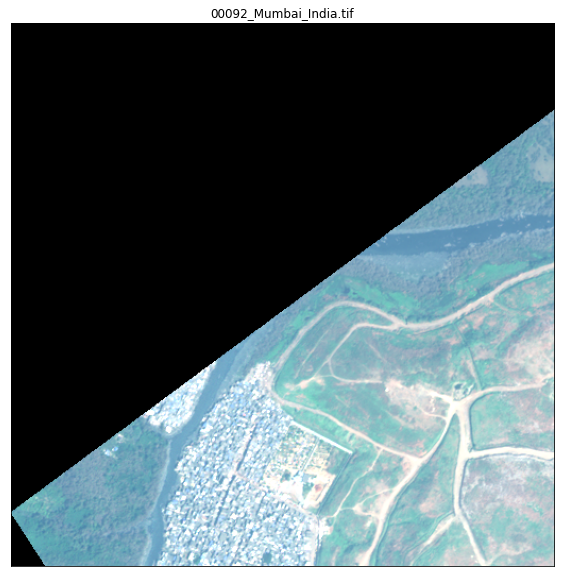

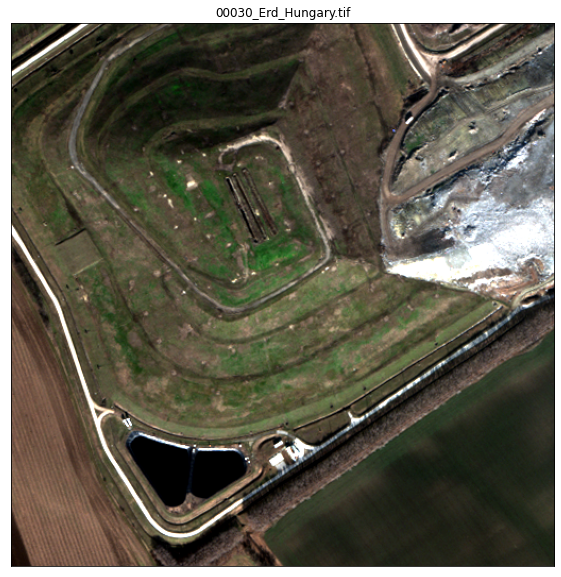

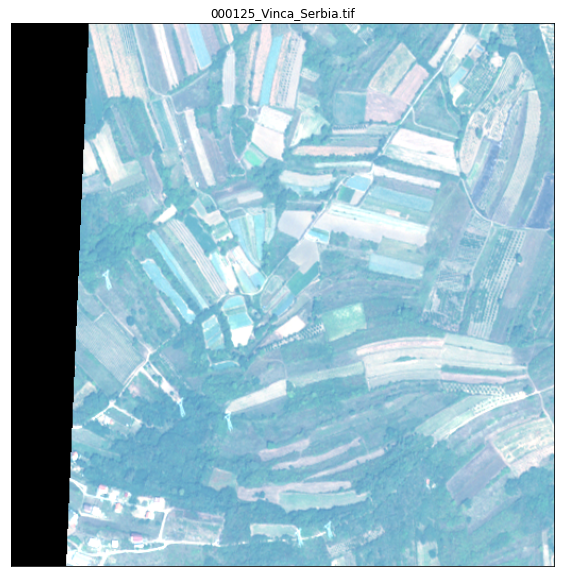

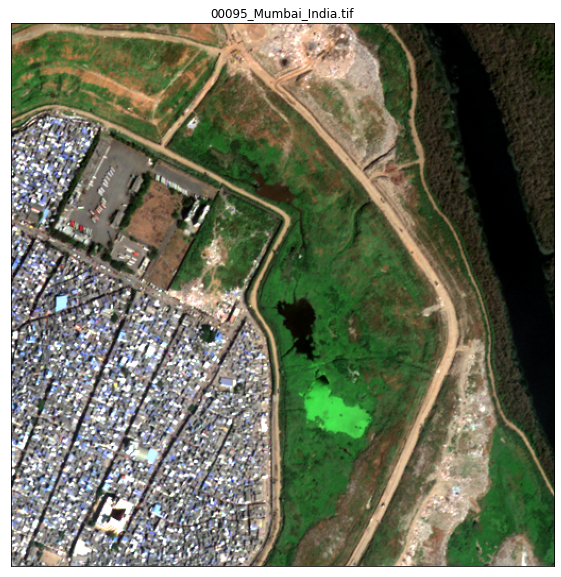

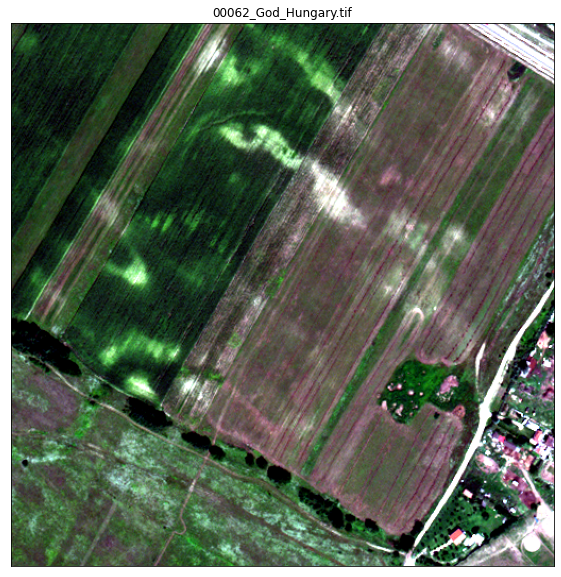

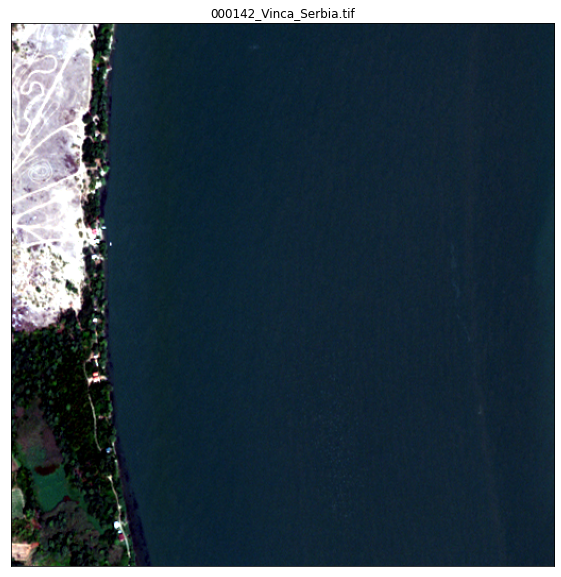

In [ ]:
fig = plt.figure(figsize=(width, height))

for idx in np.arange(batch_size):
  #plt.subplot(2, 3, idx+1)
  channels = img_info["channels"][idx].item() 
  name = img_info["name"][idx]
  image = img_info["image"][idx].numpy()
  #false color composite visualisation
  if(channels == 8):
    rgb = (4,2,1)             #R, G, B bands
  elif(channels == 4):
    rgb = (2,1,0)             #R, G, B bands
  ep.plot_rgb(image, rgb=rgb, stretch=True, title=name)
  plt.show()                        

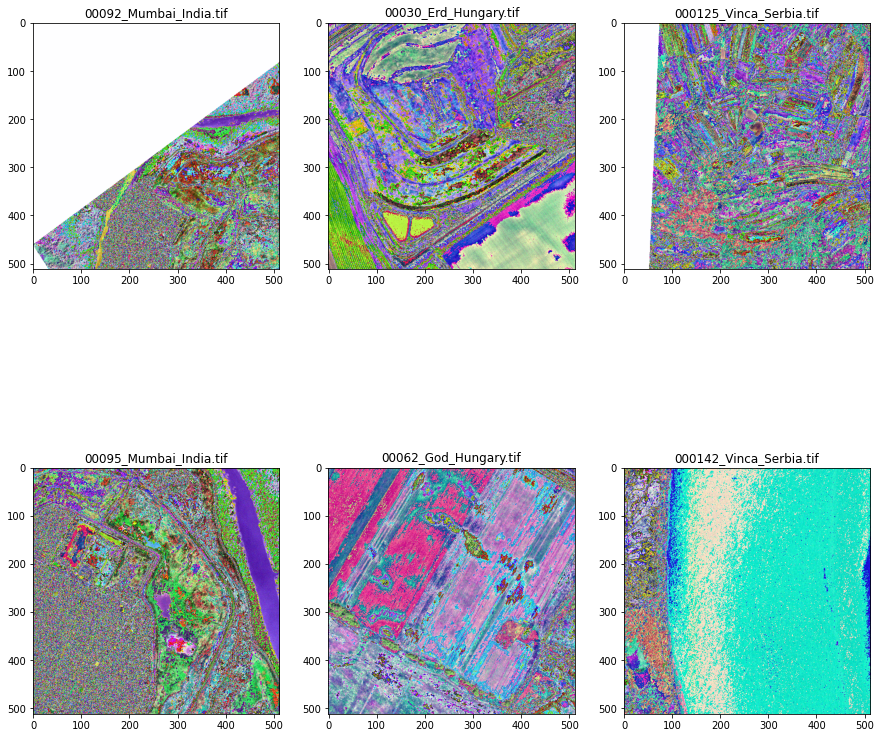

In [ ]:
fig = plt.figure(figsize=(width, height))
#the distorted images are due to normalisation
for idx in np.arange(batch_size):
  plt.subplot(2, 3, idx+1)
  channels = img_info["channels"][idx].item() 
  name = img_info["name"][idx]
  image = img_info["RGBimage"][idx].numpy()
  image = image.transpose(1,2,0)
  plt.imshow((image).astype(np.uint8))
  plt.title(name) 

Draw polygon on image:


In [ ]:
json_frame = pd.read_csv(train_labels, usecols=["json index"])
json_list = json_frame.values.tolist()

for idx in np.arange(batch_size):
  id = img_info["image_id"][idx].item()
  json_name = json_list[id-1][0]
  print(json_name)
  gdf = gpd.read_file(os.path.join(json_path, json_name))

00092_Mumbai_India.json
00030_Erd_Hungary.json
NoObj_Vinca.json
00095_Mumbai_India.json
NoObj_God.json
NoObj_Vinca.json


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

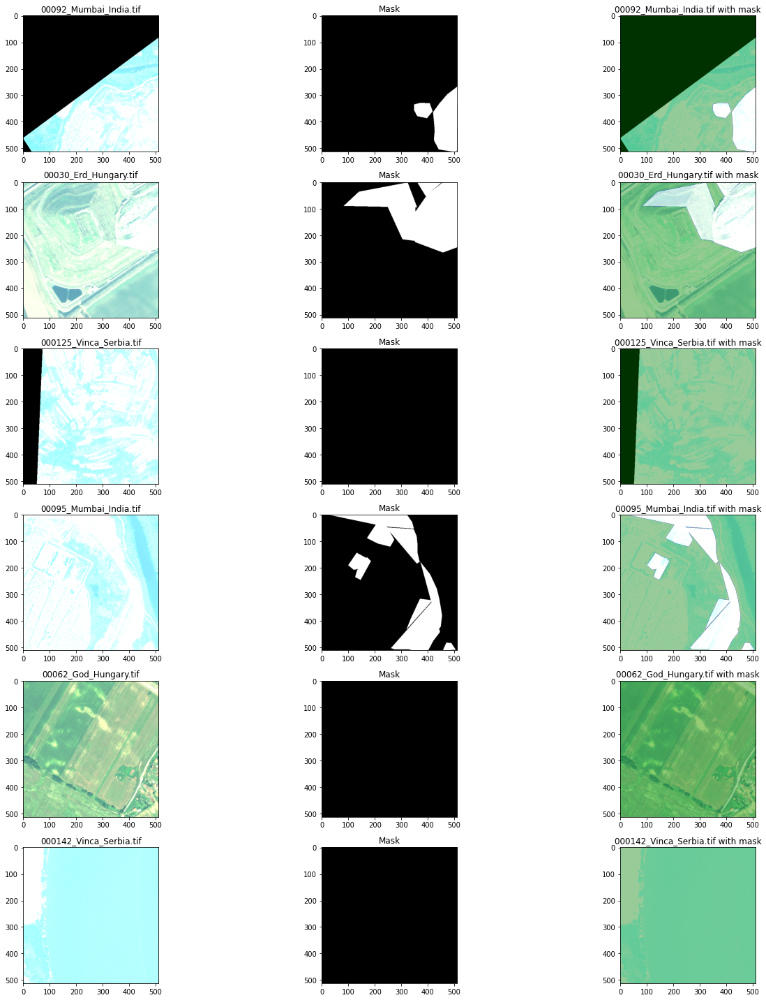

In [ ]:
count = 0
fig, axs = plt.subplots(batch_size, 3, figsize = (20, 20))

for idx in np.arange(batch_size):
  id = img_info["image_id"][idx].item()
  #print(id)
  json_name = json_list[id-1][0]
  name = img_info["name"][idx]
  #print(name)
  channels = img_info["channels"][idx].item()  
  image = im_convert(name, channels)
  mask = img_info["maskTfm"][idx].detach().numpy().transpose(1,2,0).squeeze()
  #print(image.shape)
  axs[count][0].title.set_text(name)
  axs[count][0].imshow(image)

  axs[count][1].title.set_text('Mask')
  axs[count][1].imshow(mask, cmap='gray')

  axs[count][2].title.set_text(name+" with mask")
  axs[count][2].imshow(image)
  axs[count][2].imshow(mask, cmap='ocean', alpha=0.4)
  count += 1

fig.tight_layout()
  


Case 1: Train with stratified dataset with no transforms

Training a model on the training batches

Freeze the weights until some intermediate layers to finetune the rest of the network\
https://discuss.pytorch.org/t/how-the-pytorch-freeze-network-in-some-layers-only-the-rest-of-the-training/7088/2  \
ref: https://github.com/pochih/FCN-pytorch/tree/8436fab3586f118eb36265dab4c5f900748bb02d

FCN encoder

In [ ]:
pretrained = True
enc_model = 'vgg16'

In [ ]:
maxpool_ranges = {
    'vgg11': ((0, 3), (3, 6),  (6, 11),  (11, 16), (16, 21)),
    'vgg13': ((0, 5), (5, 10), (10, 15), (15, 20), (20, 25)),
    'vgg16': ((0, 5), (5, 10), (10, 17), (17, 24), (24, 31)),
    'vgg19': ((0, 5), (5, 10), (10, 19), (19, 28), (28, 37))
}

In [ ]:
def load_model(enc_model=enc_model):
  if enc_model == 'vgg11':
    model = models.vgg11(pretrained=pretrained)
  if enc_model == 'vgg13':
    model = models.vgg13(pretrained=pretrained)
  if enc_model == 'vgg16':
    model = models.vgg16(pretrained=pretrained)
  if enc_model == 'vgg19':
    model = models.vgg19(pretrained=pretrained)
  #print(model)
  return model

In [ ]:
class VGGNet():
  def __init__(self, pretrained=pretrained, enc_model=enc_model, requires_grad=True, remove_fc=True):
    self.model = load_model(enc_model)
    self.model = self.model.to(device)
    #super().__init__(load_model(enc_model))
    self.maxpool_ranges = maxpool_ranges[enc_model]
    #use this piece of code to freeze and unfreeze layers for training
    cnt = 0
    for child in self.model.children():
        for name, param in child.named_parameters():
          if cnt < 4:
            #print(name)
            param.requires_grad = False
          cnt += 1

    if remove_fc:
      del self.model.avgpool
      del self.model.classifier
        
    print("Params to learn:")
    for name, param in self.model.named_parameters():
      if param.requires_grad == True:
        print("\t", name, "\t", param.size())

    """
    output = {}
    for idx in range(len(self.maxpool_ranges)):
      for layer in range(self.maxpool_ranges[idx][0], self.maxpool_ranges[idx][1]):
          x = self.model.features[layer]
      output["x%d"%(idx+1)] = x
    print(output)
    """

  def forward(self, x):
    output = {}
    # get the output of each maxpooling layer (5 maxpool in VGG net)
    for idx in range(len(self.maxpool_ranges)):
        for layer in range(self.maxpool_ranges[idx][0], self.maxpool_ranges[idx][1]):
          #print(layer)
          x = self.model.features[layer](x)
        output["x%d"%(idx+1)] = x
    #print(output)
    return output

In [ ]:
VGGOut = VGGNet(enc_model=enc_model, pretrained=pretrained)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth



Params to learn:
	 features.5.weight 	 torch.Size([128, 64, 3, 3])
	 features.5.bias 	 torch.Size([128])
	 features.7.weight 	 torch.Size([128, 128, 3, 3])
	 features.7.bias 	 torch.Size([128])
	 features.10.weight 	 torch.Size([256, 128, 3, 3])
	 features.10.bias 	 torch.Size([256])
	 features.12.weight 	 torch.Size([256, 256, 3, 3])
	 features.12.bias 	 torch.Size([256])
	 features.14.weight 	 torch.Size([256, 256, 3, 3])
	 features.14.bias 	 torch.Size([256])
	 features.17.weight 	 torch.Size([512, 256, 3, 3])
	 features.17.bias 	 torch.Size([512])
	 features.19.weight 	 torch.Size([512, 512, 3, 3])
	 features.19.bias 	 torch.Size([512])
	 features.21.weight 	 torch.Size([512, 512, 3, 3])
	 features.21.bias 	 torch.Size([512])
	 features.24.weight 	 torch.Size([512, 512, 3, 3])
	 features.24.bias 	 torch.Size([512])
	 features.26.weight 	 torch.Size([512, 512, 3, 3])
	 features.26.bias 	 torch.Size([512])
	 features.28.weight 	 torch.Size([512, 512, 3, 3])
	 features.28.bias 	 torc

FCN decoder

In [ ]:
class FCN8s(nn.Module):
  def __init__(self, pretrained_model=VGGOut, num_classes=num_classes):
    super().__init__()
    self.num_classes = num_classes
    self.pretrained_model = pretrained_model
    self.relu    = nn.ReLU(inplace=True)
    self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
    self.bn1     = nn.BatchNorm2d(512)
    self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
    self.bn2     = nn.BatchNorm2d(256)
    self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
    self.bn3     = nn.BatchNorm2d(128)
    self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
    self.bn4     = nn.BatchNorm2d(64)
    self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
    self.bn5     = nn.BatchNorm2d(32)
    self.classifier = nn.Conv2d(32, num_classes, kernel_size=1)
    #output = self.pretrained_model.forward()
    #print(output)

  def forward(self, x):
    output = self.pretrained_model.forward(x)
    #print(output)
    x5 = output['x5']                                 # size=(N, 512, x.H/32, x.W/32)
    #print(x5)
    x4 = output['x4']                                 # size=(N, 512, x.H/16, x.W/16)
    #print(x4)
    x3 = output['x3']                                 # size=(N, 256, x.H/8,  x.W/8)
    #print(x3)

    score = self.relu(self.deconv1(x5))               # size=(N, 512, x.H/16, x.W/16)
    #print(score)
    score = self.bn1(score + x4)                      # element-wise add, size=(N, 512, x.H/16, x.W/16)
    score = self.relu(self.deconv2(score))            # size=(N, 256, x.H/8, x.W/8)
    score = self.bn2(score + x3)                      # element-wise add, size=(N, 256, x.H/8, x.W/8)
    score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
    score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
    score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
    score = self.classifier(score)                    # size=(N, n_class, x.H/1, x.W/1)

    return score  # size=(N, n_class, x.H/1, x.W/1)


In [ ]:
FCN_model = FCN8s(pretrained_model=VGGOut, num_classes=num_classes)
FCN_model = FCN_model.to(device)
#out = FCN_model(rgb_img)

Loss and optimiser

In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.RMSprop(FCN_model.parameters(), lr=lr, momentum=momentum, weight_decay=w_decay)

In [ ]:
#https://github.com/pochih/FCN-pytorch/blob/8436fab3586f118eb36265dab4c5f900748bb02d/python/train.py
model_path = './vgg_16_FCN.pth'
def TrainFunction():
  losses = []
  accuracy = []
  for epoch in range(epochs):
    t0 = time.time()
    train_loss = 0.0
    #FCN_model.train()
    for batch, img_info in enumerate(train_loader):
      print(batch)
      #img_info = img_info.to(device)
      rgb_img = img_info['RGBimage']
      maskTfm = img_info['maskTfm']
      rgb_img = rgb_img.to(device)
      maskTfm = maskTfm.to(device)
      #print(rgb_img.is_cuda, "\t", maskTfm.is_cuda)
      #print(rgb_img.shape, "\t", maskTfm.shape)
      #print("Finding model output")
      outputs = FCN_model(rgb_img)
      #print("Calculating loss")
      loss = criterion(outputs, maskTfm)
      #print("accumulating training loss")
      train_loss += loss.item()*rgb_img.size(0)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      print("epoch: {}, batch: {}, Training loss: {}".format(epoch, batch, train_loss))
    train_loss = train_loss/len(train_loader)
    print("Finish epoch: {}, Loss in epoch:{}, time elapsed: {}".format(epoch, train_loss, time.time() - t0))
    torch.save(FCN_model, model_path)
    ValFunction(epoch)

In [ ]:
def ValFunction(epoch):
  FCN_model.eval()
  total_ious = []
  pixel_accs = []
  for batch, img_info in enumerate(test_loader):
    rgb_img = img_info['RGBimage']
    maskTfm = img_info['maskTfm']
    rgb_img = rgb_img.to(device)
    maskTfm = maskTfm.to(device)
    outputs = FCN_model(rgb_img)
    outputs = outputs.data.cpu().numpy()    

In [ ]:
TrainFunction()